# ELIMINAR AQUEST CHUNK
# !!!!!!!!!!!!!!!!!!!!!!!!!


Lexical features, semantic features and combination. Use all 
new components: such as ML, or other options from the table


Rubric:

	- Bad approach: Not using feature selection -> is penalizable using hand crafted approaches
		  - ((Using test set for anything, especially for selecting the model))
	- Explain why we use a subset of the features
	- Lexical features, semantic features and combination. Show results at least in feature selection.
  

In [98]:
%load_ext autoreload
%autoreload 2

from code_.data_reader import data_reader
#from code_.feature_extractor import Features
from code_.model import Models
import code_.utils as utils


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Semantic Textual Similarity

Authors:

    - Benjami Parellada
    - Clara Rivadulla

---
---
---

# Introduction

Semantic Textual Similarity (STS) measures the degree of semantic equivalence between two texts. It is also known as paraphrase detection, where a pair of texts is a paraphrase when both texts describe the same meaning with different words. Before the advent of neural networks and word embeddings with `word2vec` by Google in 2013 - where an "embedding" is a numeric vector representation of natural language texts such that computers can understand the context and meaning - this was a difficult problem to solve. The nuances of natural language make it hard for machines to understand the context and meaning of different texts, for example, two sentences could have no word in common but still mean the same. STS is related to numerous NLP tasks, such as machine translation, text summarization, machine reading and understanding, question answering, among other tasks. 

Thus, in this project, we will travel back in time, to an era before word embeddings reigned supreme, to understand and extract different features from text in order to compare the similarity between two sentences. Concretely, we use the data set and description of task Semantic Textual Similarity from SemEval-2012 Task 6. Using this data, we extract lexical and syntactical dimensions in order to train a model that is able to detect when two sentences are similar. Moreover, we will comment and compare the different features in this scenario, explaining which are the most relevant.

## Structure of the project

The whole project is contained in a general folder, `STS`, which contains the following directories with their respective files:
- `code_`: where the `.py` files used for reading the data (`data_reader.py`), pre-processing it, extracting the desired features (`feature_extractor.py`) and defining the models (`model.py`) to be trained are.
- `test-gold` and `train`: where test and training data is (`'SMTeuroparl'` `.txt` files).

## Dataset

The source of the dataset is from *SemEval-2012 Task 6*, where 3 different datasets from different sources have been manually tagged. The three sources of data all have the same format, where there are two sentences $S_1$ and $S_2$ and the objective is to compute how similar these sentences are to each other. The datasets are:

- MSR-Paraphrase, Microsoft Research Paraphrase Corpus, which contains 750 pairs of sentences from thousands of news sources from the web.
- MSR-Video, Microsoft Research Video Description Corpus, which contains 750 pairs of sentences describing videos.
- SMTeuroparl: WMT2008 development dataset (Europarl section), which contains 734 pairs of sentences from a translation from French to English.

These three datasets are given to us to train and do model selection. Finally, there are more 5 more datasets which were not presented that contain the evaluation test partition of the data. The following summarizes these:

- For MSR-Paraphrase, we are given 750 unseen pairs of sentences, where the final model should be evaluated.
- For MSR-Video they add 750 unseen pairs of sentences.
- For SMTeuroparl, they add 459 pairs.

Additionally, two extra datasets are provided which are from different context.
- SMTnews, which contains 399 pairs of sentences from news conversation sentence pairs from WMT.
- OnWN, which contains 750 pairs of sentences where the first comes from Ontonotes and the second from a WordNet definition.

We explain these to understand the context of the task, however, we will not be using any external information that could bias our Test evaluation metrics. We will only train the machine learning models, do feature selection, and model selection, using only the original train data given.

## System Evaluation

As already mentioned, the target feature we are trying to predict is how similar two sentences are. Given two sentences $S_1$ and $S_2$, we are trying the similarity score. This performance is evaluated using the Pearson product-moment correlation coefficient between the output score from our system and the human score, henceforth, referred as Gold Standard. Reading through the overall conclusion paper on the SemEval-2012 Task 6, we see that there is some controversy, as in it they concatenate the results of all the datasets before calculating the Pearson correlation. This is said to lose some of the individual scores on the datasets. Nevertheless, for the purpose of this project, we will do the concatenation of all the datasets into one to train and evaluate. We feel it makes more sense to have a global dataset that tries to predict how similar two sentences are independent of the original context.

Regarding the Gold Standard, it was annotated by humans where they were asked to score the pairs with the following scale interpretation:

0. The two sentences are on different topics.
1. The two sentences are not equivalent, but are on the same topic.
2. The two sentences are not equivalent, but share some details.
3. The two sentences are roughly equivalent, but some important information differs/missing.
4. The two sentences are mostly equivalent, but some unimportant details differ.
5. The two sentences are completely equivalent, as they mean the same thing.  

For each sentence pair, the Gold Standard represents the average of 5 scores from different annotators.

# Methodology
After this not-so-short introduction, we present the work we have done in order to complete the STS task. The sections we cover are:
- Preprocessing.
- Feature Extraction.
- Feature Combination.
  - Model Selection.
  - Feature Selection
  - Feature Importance and selection.






## Preprocessing

In order to do the preprocessing of the sentences, we perform the following transformations with the `preprocess` function in `feature_extractor.py` to every sentence:
- Convert it to **ASCII** with the `unidecode` function.
- Remove hyphens and forward slashes.
- Angular brackets (`<`, `>`) that enclose the tokens are stripped (matches the interior string of the format `<XYZ>` and returns `XYZ`).
- Normalize dollar (`$`) values, as no other monetary symbol appears in the train dataset.
- Convert `n't` to `not`, `'t` to `not`, `'re` to `are`, `'s` to `is`, `'d` to `would`, `'ll` to `will`, `'ve` to `have`, `'m` to `am`, and double white spaces to single ones.

We also apply a preprocessing function, `preprocess_tokenized`, to the tokens of every sentence in order to round numeric values to just one decimal or convert them to integer in case they finish with `'.0'`.




## Feature extraction
Before we can train any model, we need to extract features from the sentence pairs. We have explored many different features, here is a little explanation of each and every one:



### Lexical Features

For every lexical feature, we keep them both **with and without stop-words**. 

##### **Tokens**
We extract **tokens** and their POS-tags with `nltk`'s `word_tokenize` and `pos_tag` functions respectively. We apply the mentioned `preprocess_tokenized` function to the extracted tokens. Separately, we also extract tokens with the use of `spacy`'s `nlp` model to resolve **coreferences**.

##### **Lemmas**
We extract **lemmas** from tokens with the implemented `pos_wn` function and with the use of the `WordNetLemmatizer`. We also extract lemmas using `spacy` with the `en_core_web_sm` model. As with tokens, we also extract lemmas with the use of `spacy`'s `nlp` model to resolve **coreferences**.

##### **Word N-grams**
We use `nltk`'s `ngrams` function to get ***unigrams*, *bigrams*, *trigrams* and *fourgrams*** of words from the tokens of every sentence.

##### **Character N-grams**
We use regex to get ***bigrams*, *trigrams* and *fourgrams*** of characters from the tokens of every sentence, with and without stop-words. 

A note on these, we tried removing the numeric tokens when doing the N-grams, however, we found worse scores overall. Thus, we omitted removing the numeric tokens.

##### **Longest common subsequence**
We calculate the **longest common subsequence** between every two sentences from the list of tokens of each one and normalize it dividing it by the length of the shortest sentence. 

##### **Longest common substring**
The same as the previous one, but calculating the **longest common substring** instead. 

##### **Levenshtein distance**
We use `nltk`'s `edit_distance` function to compute the Levenshtein distance (minimum number of single-character edits (insertions, deletions or substitutions) required to change one sentence into the other) between the two sentences (considering a sentence as its lemmas joined by a blankspace). We normalize the output dividing it by the length of the longest sentence. `nltk.edit_distance(sent1, sent2) / max(len(sent1), len(sent2))`. 

##### **Function Word Similarity**
We use **function word frequency vectors** to compare **stopwords**' frequencies among pairs of sentences. That is, we create two vectors of 0s of length equal to the number of stopwords and put 1 if a stopword is among the sentence's tokens. Once we've iterated over all the stopwords, we return the correlation between these two vectors. 

##### **Vector space sentence**
Each sentence is represented as a single distributional vector $u(·)$ by summing the distributional vector of each word w in the sentence $S: u(S) = \sum_{w∈S} x_w$, where $x_w$ is the vector representation of the word $w$. We use the cosine similarity to calculate the vector space sentence similarity: $|cos(u(S_1), u(S_2))|$

##### **Stemming**

We use Porter Stemmer to

##### **Coreference**

We solve the coreferences and compute the lemmas and tokens on both



### Syntactical Features

##### **Synsets**
We extract synsets using `lesk`, which returns a synset for an ambiguous word in a context. We also extract synsets with the `synsets` function from `wordnet`, that loads all synsets with a given lemma and part of speech tag. We will use these synsets in order to compare pairs of sentences by computing several similarity metrics, explained later on.  

##### **Synsets Similarities**
We use `nltk`'s synset similarity functions to compare the most frequent synsets of every token in a sentence to the most frequent synsets of every token in the other one. The similarities we compute for every pair of sentences are:  **Leacock-Chodorow similarity**, **Path similarity**, **Wu-Palmer similarity**, and **Lin similarity**. The resulting feature is the sum of these similarities divided by the length of the similarities list between the most frequent synsets of the tokens of the two sentences.

##### **Named Entities**
We chunk POS pairs with `nltk`'s `ne_chunk` function, then get the triads with the token, POS-tag, and if it's a named entity with the `tree2conlltags` function. We discard stop-words, empty or non-alphanumeric token and keep only named entities and other tokens. 

##### **Vector space sentence IC** 
Similar to the previous Vector space sentence, however, $u_W(·)$ uses the information content $ic(w)$ to weigh the LSA vector of each word before summation: $u_w(S) = \sum_{w∈S} ic(w)x_w$. The vector space sentence similarity is: $|cos(u_w(S_1), u_w(S_2))|$

##### **WordNet augmented word overlap (WAWO)**
For this, WordNet is used to assign partial scores to words that are not common to both sentences. The WordNet augmented coverage $P_{WN} (·, ·)$ is defined as:

$$P_{WN} (S_1, S_2) =  \frac{1}{|S_2|} \sum_{w_1∈S_1}score(w_1, S_2)$$

$$score(w,S)=\begin{cases}
1 \quad &\text{if} \ w∈S  \newline max_{w'∈S} sim(w, w') \quad &\text{otherwise}  \\
     \end{cases}$$

where $sim(·, ·)$ represents the WordNet path length similarity. The WordNet-augmented word overlap feature is defined as a harmonic mean of $P_{WN} (S_1, S_2)$ and $P_{WN} (S_2, S_1)$.

##### **Weighted word overlap (WWO)**
We use the information content $ic(w)=ln\frac{∑_{w'∈C}freq(w')}{freq(w)}$, where $C$ is the set of words in the corpus and $freq(w)$ is the frequency of the word $w$ in the corpus. The weighted word coverage of the second sentence by the first sentence is given by: $wwc(S_1, S_2)=\frac{∑_{w∈S_1∩S_2}ic(w)}{∑_{w'∈S_2}ic(w')}$. The weighted word overlap between two sentences is calculated as the harmonic mean of the $wwc(S_1, S_2)$ and $wwc(S_2, S_1)$.

##### **Codependency Parser**

We use the Stanford Codependency Parser to compute the governing triplets of sentences. We compere these.




### Other Features

#### **Number of POS tags**

We extract a new feature that compares some types of POS tags between the 2 sentences. If both sentences contain no tag of the selected type, or, if they have the same count, 1 is returned. Otherwise, we return $1-\frac{|count_1 - count_2|}{count_1 + count_2}$, where $count_1$ and $count_2$ are the number of POS tag of that type in each sentence. We do this for:

1. **Verbs**
2. **Nouns**
3. **Adjectives**
4. **Adverbs**

#### **Numeric features**

The following features compare the sets of numbers $N_1$ and $N_2$ in two sentences:
1. **Numeric Feature: Log**: $log (1 + |N_1| + |N_2|)$
2. **Numeric Feature: Intersection**: $2\frac{|N_1 ∩ N_2|}{(|N_1| + |N_2|)}$
3. **Numeric Feature: Bool**: $N_1 ⊆ N_2∨N_2 ⊆ N_1$

### Similarities
##### **Jaccard similarity**
We compute Jaccard similarity for each pair of sentences using *tokens, lemmas, N-grams, NEs,* etc. 
The `nltk` function used is `jaccard_distance` and it gives us the **distance** between both sentences, while we are interested in the **similarity**. By using the distance, when two sets are similar we get a value closer to 0, meanwhile when they are more distinct we get a value closer to 1. This is different from how the gold standard is in the dataset, similar sentences have higher values, and dissimilar sentences have lower values.
Hence, this is why we use the similarity, which is the inverse of the distance, and we can calculate it as such:

$$similarity_{jaccard} = 1 - distance_{jaccard} = 1 - \frac{|X \cup Y| - |X \cap Y|}{X \cup Y}$$

##### **Sørensen–Dice coefficient**

Given two sets, X and Y, the Sørensen–Dice coefficient is defined as: ${\displaystyle DSC={\frac {2|X\cap Y|}{|X|+|Y|}}}$

As with Jaccard, we use this coefficient to get the similarities between the pairs of sentences from sets of: *tokens, lemmas, NEs, N-grams,* etc. 


##### **Overlap**
For sets of *unigrams, bigrams* and *trigrams*, both with and without considering stopwords, we perform another similarity measure called Overlap, which is basically a harmonic mean between the length of the sets with their intersection:

$$2 \times { \left(\frac{len(set_1) + len(set_2)}{len(set_1\cap set_2)}\right)}^{-1}$$

In [99]:
# Read the data
x_train, y_train = data_reader(train = True, input_files = ['MSRpar.txt', 'MSRvid.txt', 'SMTeuroparl.txt'])
x_test, y_test = data_reader(train = False, input_files = ['MSRpar.txt', 'MSRvid.txt', 'SMTeuroparl.txt', 'surprise.OnWN.txt', 'surprise.SMTnews.txt'])

Reading the training data
Data contains 2222 sentences
Reading the test data
Data contains 3108 sentences


In [100]:
# Compute the features
#train_features = Features(x_train)
#test_features = Features(x_test)

# extract the different types
#train_all = train_features.extract_all()
#train_lexic = train_features.extract_lexic()
#train_syntactic = train_features.extract_syntactic()

#test_all = test_features.extract_all()
#test_lexic = test_features.extract_lexic()
#test_syntactic = test_features.extract_syntactic()

In [101]:
import pandas as pd
train_all = pd.read_csv('train_all.csv').iloc[: , 1:]
train_lexic = pd.read_csv('train_lexic.csv').iloc[: , 1:]
train_syntactic = pd.read_csv('train_synt.csv').iloc[: , 1:]

test_all = pd.read_csv('test_all.csv').iloc[: , 1:]
test_lexic = pd.read_csv('test_lexic.csv').iloc[: , 1:]
test_syntactic = pd.read_csv('test_synt.csv').iloc[: , 1:]


## Feature Combination Modeling

In this section, we explain how we combine the features with the use of Machine Learning and which are the different frameworks proposed to fit the model and return an output. The modeling done in this work was quite complex and required many steps to achieve the desired results. The following are the different frameworks used and they were combined and selected.


### Frameworks 

The frameworks we define are different ways to train and explore predict the sentence similarity. These frameworks are independent of the underlying Machine Learning models that they are using. The differences between them are in how to predict the known and unknown data sources.

#### Global

The *Global* framework is the classical Machine Learning approach, where one builds one model and uses it to predict the resulting data. The model will try to learn a general mapping from the features, independent of the origin of the data. Thus, when we get new data, it will predict it according to what it has learned from the original data sources.

The figure represents the global structure of training the Framework. A data table is fed into the model, with the corresponding regression feature (gold standard). The model will fit to the data independent of the data source, and will predict values independent of it as well.



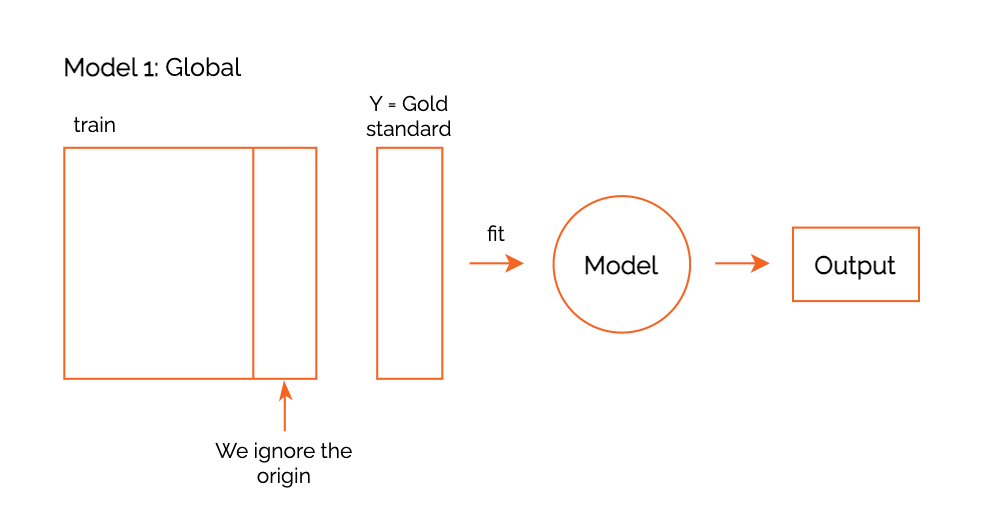

While developing, we focused on increasing the Pearson correlation of this singular model. However, after reading carefully some of the papers, we realized that they were using another more fine-tuned approach to solve the STS task. These are the following approaches.


#### Specific

We observed that the participants of the challenge were using specific models built on each dataset, and then using these to predict the different similarities. While this might seem a bit like cheating, it is important to remember that each corpus has its own stylistic signature, and different texts will have different importances. Therefore, what works on one corpus might not work on another. Hence, while we would like to be agnostic to the origin of the data, the top performing papers used specific models for each dataset. ~So if they are going to cheat, they have forced our hand to do so as well~.

In this framework, we train a model for every origin of the data and use the previous model (*Global*) when the origin is unknown. To compute the final Pearson correlation, the predictions of each model with its corresponding test set are concatenated into one to calculate the Pearson correlation. 

The figure represents how each model is trained. Using the different origin of the datasets, we build 3 singular models which predict each one. On the test data, if the origin is one of these, we use the model trained with its corresponding origin. Else, we use the Global model to evaluate it.



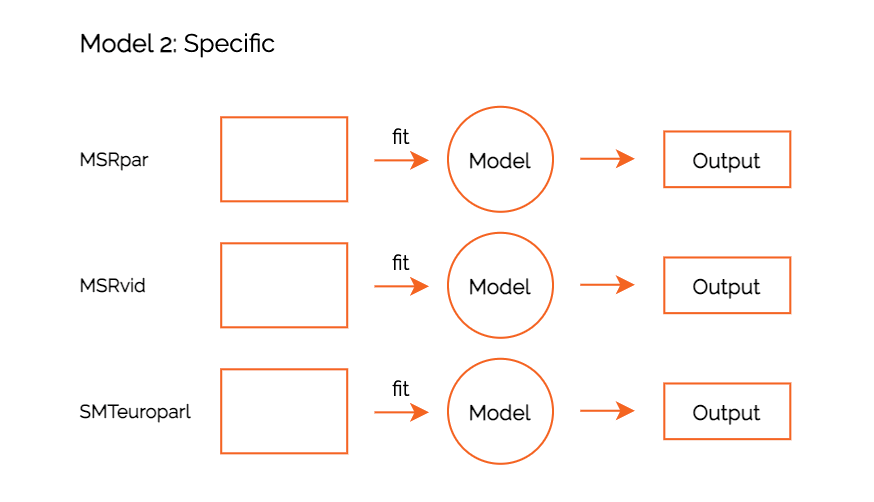

#### Ensemble 

Reading the top performing paper, they spoke how they wanted to try to do a linear combination of each of the different models but they ran out of time. ~Stealing~ Following their idea, we train a "top"-layer which will combine the predictions of all the previous models into one. This ensemble model, is only used to predict when the data is unknown, hence, it acts like a replacement for the *Global* model in the previous framework.

Once each *Specific* and *Global* frameworks are built, we predict each of the training sample features with all models. These predictions are used to train the *Ensemble* model to combine them into one prediction using the information of all the other models. This is later on used to predict data from unknown sources.

The figure represents how to train the Ensemble model. Once all the 4 other models are trained, each with their respective origin datasets - or all for *Global* - we build a singular model. On the test data, if a sample is from a known data origin, we use the already *Specific* models. However, if the origin is unknown, we predict the sample with all the different models and then use the *Ensemble* to get the final prediction. 

Specifically, the Ensemble framework uses the predictions of the Train for each model (*Specific + Global*) to build an **SVM** classifier that predicts unknown data sources. 

![image.png](https://i.imgur.com/vrXp3VH.jpeg)

### Machine Learning Methodology

After getting familiar with the different frameworks, we need so specify a few things in order to do a correct methodology to do Model Selection and Feature Selection. The following is a justification of the steps.

Our process is a 3-way split with *Train*, *Validation*, and *Test*. The Train and Test partitions have already been given to us by the organizers. However, to be able to do Model Selection and Feature Selection, we split the Train data into another set *Validation*. This partition is 20% of the size of the Train set, and is stratified such that all the origins appear in the same frequencies they appear in the Train set. This will avoid optimistic evaluations of the model.

Therefore, we use the partitions in the following way:
- Train: fit all the different frameworks, tune the parameters of the models.
- Validation: once fitted, check the Pearson Score. Do model selection and feature selection using this set.
- Test: once we have selected the best model (model selection and feature selection) using the Validation set, use the Test set to evaluate it on data it has never seen.

Before doing Feature Selection, we must choose what model we shall use. Otherwise, how do we even select features that work well for our model? Well, we could do filter methods... but that is beside the point. The following presents more information about the Model Selection and Feature Selection Process.




![image.png](https://i.imgur.com/gInelD7.jpeg)


#### Step 1: Model selection

In order to select the best possible model, we propose 3 different approaches, in which we will choose between **SVM** or **Random Forest** according to the results we get with the validation set.  

Each framework can use any underlying regression model to do predicitons. To keep the process simple and our analysis short, we only explore two different regressors.

*   **SVM**: very popular, and usually works very well. Most of the papers in the competition used SVM to combine features. We stick only with RBF-kernels, to achieve non-linearity.
*   **Random Forest**: used since we can explain the features quite easily thanks to the feature importance. Thus, it is easy to explain the contributions of each feature. Moreover, there are packages that help explain how the system is doing singular predictions, which we will use.


To select the model, first we need to fit each of the regressors to our data. However, it could be the case that the better regressor with optimized parameters returns worse due to bad default parameters. To avoid this happening, we do a brief hyperparameter tuning to find better models, and, once this is done, we evaluate on the validation partition set. 


The pipeline is the one presented in the image. First, we find the best parameters, by using 5-fold cross-validation grid-search to estimate the performance of machine learning models using. Once the best is found, it is refit using all the 5-folds, and evaluated on the Validation set. The one that returns the highest score in this set will be the one we select.

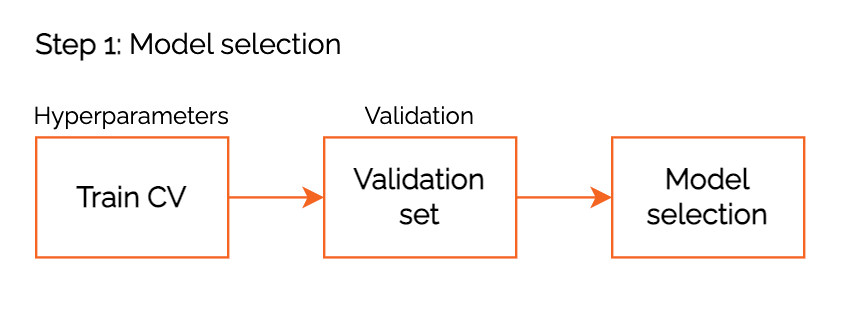



#### Step 2: Feature selection & Refit


Once the model has been selected, we can select a subset of Features that are a good representation of the whole dataset. This is done for two reasons. First, to simplify the complexity of the model. Second, it can reduce noise of the regressors and achieve better generalization results.

Starting from a tuned estimator from the previous step, we use *recursive feature elimination cross-validation* to remove features. The goal of the function is to select features by recursively considering smaller and smaller sets of features. Initially, a set of features and the importance of each feature is obtained through feature importance or some specific attribute. Afterwards, the least important features are pruned from the current set. This is done with cross-validation to find the optimal number of features.

Again, we select the best model with the Validation set. However, we are using this set a bit too much, and it is possible that we are obtaining optimistically biased performance estimates. The correct approach would be to split again the dataset, or use nested cross-validation. However, while it might not look like it, we do have a life.

After the final set of features is found through the cross validation, we refit the regressor with the whole training data (train + validation) and evaluate an unbiased performance on the Test set.


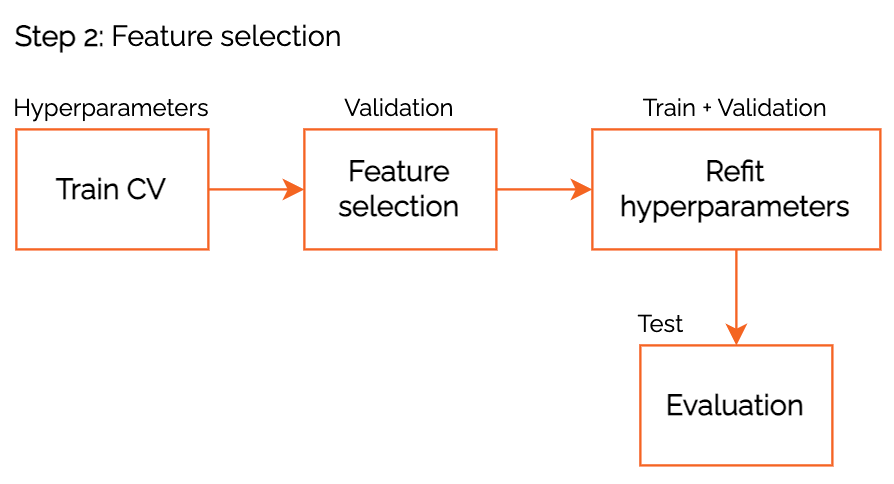

#### Feature Importance and Prediction Interpretation

When using Tree-based models, we can use the feature importance based on the mean decrease in impurity (MDI) quantified by the splitting criterion of the decision trees. These are easy to interpret and use, however, they are strongly biased and favor high cardinality features.

Thus, Permutation feature importance is an alternative to the MDI. Moreover, it works on all types of estimators, without the need of it being Tree-based. The permutation feature importance is defined to be the decrease in a model score when a single feature value is randomly shuffled. It breaks the relationship between the feature and the target, the drop in the model score is indicative of how much the model depends on the feature.

Nevertheless, the contributions of each feature can be measured in tree-based methods permitting us the ability to explain how it is working. The prediction is simply the average of the bias terms plus the average contribution of each feature:

$$F(x) = \frac{1}{J}{\sum\limits_{j=1}^J {c_{j}}_{full}}  + \sum\limits_{k=1}^K (\frac{1}{J}\sum\limits_{j=1}^J contrib_j(x, k))$$

More information about the interpretation can be found [here](https://blog.datadive.net/interpreting-random-forests/). 


# Results

Finally, we present the results of the project. In this section, the aforementioned topics are executed, and we explain the importance of the variables as well as the Pearson correlation obtained.


## Model Selection

We first do a run to select which model we will use. We do this with the full combination of features, since it will provide more information, and not present any possible bias of only using a subset of them. This part is done to select the framework and models that works the best. For each, we return the Pearson obtained from the CV, and the one obtained in the validation set.


### Framework 1: Global Model

In [102]:
# STEP 1: MODEL SELECTION
models = Models(train_all, test_all, y_train, y_test, x_train['Origin'], x_test['Origin'], x_train)

# we build a global with SVM
models.build_global('SVR')
models.evaluate_train()
models.evaluate_test(validation = True)

--------------------------------------------------------------------------------
Evaluation on TRAINING

Pearson Correlation for each specific dataset:
             Pearson CV Train
Dataset                      
MSRpar               0.850895
MSRvid               0.850895
SMTeuroparl          0.850895

Average Pearson Correlation over all TRAIN CV:
         Average Pearson CV Train
Dataset                          
Overall                  0.850895
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Evaluation on VALIDATION

Pearson Correlation for each specific dataset:
             Pearson Validation
Dataset                        
MSRpar                 0.689729
MSRvid                 0.801644
SMTeuroparl            0.630440

Overall Pearson Correlation for the concatenation of the VALIDATION datasets:
         Pearson Validation
Dataset                    
Overall           

In [103]:
# we build a global with Random Forest
models.build_global('RandomForestRegressor')
models.evaluate_train()
models.evaluate_test(validation = True)

--------------------------------------------------------------------------------
Evaluation on TRAINING

Pearson Correlation for each specific dataset:
             Pearson CV Train
Dataset                      
MSRpar               0.819587
MSRvid               0.819587
SMTeuroparl          0.819587

Average Pearson Correlation over all TRAIN CV:
         Average Pearson CV Train
Dataset                          
Overall                  0.819587
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Evaluation on VALIDATION

Pearson Correlation for each specific dataset:
             Pearson Validation
Dataset                        
MSRpar                 0.696184
MSRvid                 0.794254
SMTeuroparl            0.662410

Overall Pearson Correlation for the concatenation of the VALIDATION datasets:
         Pearson Validation
Dataset                    
Overall           

Foremost, we see that the score, obtained from the CV training set, is way higher in both cases than in the validation. This is a clear sign of overfitting, and indicative that we possibly need to do feature selection to remove noisy features. This effect is a bit larger in the SVM, than the Random Forest.

After comparing both outputs, we see that in the validation set, using Random Forest works a bit better than SVM. The difference could be considered negligible, but added to the larger overfitting of the SVM and easier explainability of the Random Forest, we rather go with the RF.

Also, we see how on both cases, MRSvid is being predicted much better than the others. For the other text origins, the prediction seems pretty similar. This is probably the reason of the overfitting, it is fitting too much the input of the MSRVid source and not considering the others. Knowing this, it makes more sense to use some of the other frameworks to avoid this bias.

Thus, for the global model, we would rather use: **Random Forest**.

### Framework 2: Specific Model

In [104]:
#models.build_global('RandomForestRegressor') # will be using already the previous global model
models.build_specific('SVR')

/home/beny/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4464: NearConstantInputWarning: An input array is nearly constant; the computed correlation coefficient may be inaccurate.
  warnings.warn(stats.NearConstantInputWarning(msg))
/home/beny/.local/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4464: NearConstantInputWarning: An input array is nearly constant; the computed correlation coefficient may be inaccurate.
  warnings.warn(stats.NearConstantInputWarning(msg))


In [105]:
models.evaluate_train()
models.evaluate_test(validation = True)

--------------------------------------------------------------------------------
Evaluation on TRAINING

Pearson Correlation for each specific dataset:
             Pearson CV Train
Dataset                      
MSRpar               0.700277
MSRvid               0.827789
SMTeuroparl          0.684507

Average Pearson Correlation over all TRAIN CV:
         Average Pearson CV Train
Dataset                          
Overall                  0.737404
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Evaluation on VALIDATION

Pearson Correlation for each specific dataset:
             Pearson Validation
Dataset                        
MSRpar                 0.715805
MSRvid                 0.770742
SMTeuroparl            0.714862

Overall Pearson Correlation for the concatenation of the VALIDATION datasets:
         Pearson Validation
Dataset                    
Overall           

In [106]:
#models.build_global('RandomForestRegressor') # will be using already the previous global model
models.build_specific('RandomForestRegressor')
models.evaluate_train()
models.evaluate_test(validation = True)

--------------------------------------------------------------------------------
Evaluation on TRAINING

Pearson Correlation for each specific dataset:
             Pearson CV Train
Dataset                      
MSRpar               0.691545
MSRvid               0.834921
SMTeuroparl          0.684320

Average Pearson Correlation over all TRAIN CV:
         Average Pearson CV Train
Dataset                          
Overall                  0.736762
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Evaluation on VALIDATION

Pearson Correlation for each specific dataset:
             Pearson Validation
Dataset                        
MSRpar                 0.716854
MSRvid                 0.790410
SMTeuroparl            0.721437

Overall Pearson Correlation for the concatenation of the VALIDATION datasets:
         Pearson Validation
Dataset                    
Overall           

We now observe how on the training set CV, the results are pretty much the same, independent of the regression model used. We still see how MSRvid has the highest score of them all.

Nevertheless, checking the validation, we see that while MSRvid is still being perhaps a bit too overestimated, the other models seem to be working better. This results in a higher Pearson Correlation than in the first framework. Thus, we would rather use Framework 2 over 1. Additionally, we see that, Random Forest beats again the SVM model and results in higher Correlation with the gold standard.

Thus, for the Specific models, we would rather use: **Random Forest**.

We could decide to train different regressors for each origin source. However, we rather use something consistent for all the models and not fine-tune the problem so much.

### Framework 3: Ensemble Model

In [107]:
models.build_global('RandomForestRegressor')
models.build_specific('RandomForestRegressor')
models.build_ensemble('SVR')
models.evaluate_train()
models.evaluate_test(validation = True)

--------------------------------------------------------------------------------
Evaluation on TRAINING

Pearson Correlation for each specific dataset:
             Pearson CV Train
Dataset                      
MSRpar               0.691545
MSRvid               0.834921
SMTeuroparl          0.684320

Average Pearson Correlation over all TRAIN CV:
         Average Pearson CV Train
Dataset                          
Overall                  0.736762
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Evaluation on VALIDATION

Pearson Correlation for each specific dataset:
             Pearson Validation
Dataset                        
MSRpar                 0.716854
MSRvid                 0.790410
SMTeuroparl            0.721437

Overall Pearson Correlation for the concatenation of the VALIDATION datasets:
         Pearson Validation
Dataset                    
Overall           

We present the previous outputs as a mere formality. We do not have a way of correctly checking the performance of the Ensemble regressor. Since it is using the other models to build the ensemble, it will always predict the same as the Specific scenario unless we have new unseen data.

We considered the following:
  - Input new unseen data ourselves to the system. However, how do we get a similar score to the one given in the Gold Standard? The Gold Standard was the mean of 5 different people scoring the same sentences, and while we could emulate it, it is possible that we give answers that are biased.
  - Remove the Origin label of some of the validation set data to be predicted as unseen data. Again, while this was tempting, the Ensemble would be training on biased data. Since one of the models would have been trained with the origin data, it will give a score closer to the expected one than the rest of Specific Regressors, and the Ensemble might mistakenly think that it is more important than the rest.

Therefore, we use an SVM to train the regressors' ensemble. Conceptually, this model makes more sense since it will be aggregating the different models to predict unknown data, thus we will be using Framework 3 with the following elements:
- Global model predictor: Random Forest
- Specific model predictor: Random Forest
- Ensemble model predictor: SVM

## Model Evaluation

After selecting the model, we will now proceed to selecting which features work best for the STS task, and give the evaluation of these models.

We are asked to try:
  - Lexical Features
  - Syntactical Features
  - Combination of both

Thus, we will do the whole Step 2 as presented in the methodology for each of these different subsets. From Feature Selection to Model evaluation. Take into consideration that in the original competition, they were allowed to use three submissions. Thus, we can consider each of these a submission to the competition and obtaining our unbiased Test score. 

### Lexical Features

We first observe the covariance between features and a PCA regarding the data.



#### Feature Exploration

In [108]:
utils.covariance_matrix_plot(train_lexic, y_train)


We can see many features highly correlated between themselves. Some common observations:
- Features representing the same information but with different metrics seem to be always highly correlated, either positively or negatively.
- The same feature using stopwords and not using them are usually highly correlated.
- Dice and Jaccard seem to be negatively correlated between themselves. It would seem to be one is almost the opposite of the other, but not perfectly since the correlation is not perfect. 
- 3-Grams and 4-grams seem to be quite uncorrelated from the rest of features.
- The gold standard seems to be correlated with many features, however there does not seem to be any that is much more apparent than the rest.

[pca] >Processing dataframe..
[pca] >The PCA reduction is performed on the [56] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[10]
[pca] >Outlier detection using SPE/DmodX with n_std=[2]
[pca] >Plot PC1 vs PC2 with loadings.


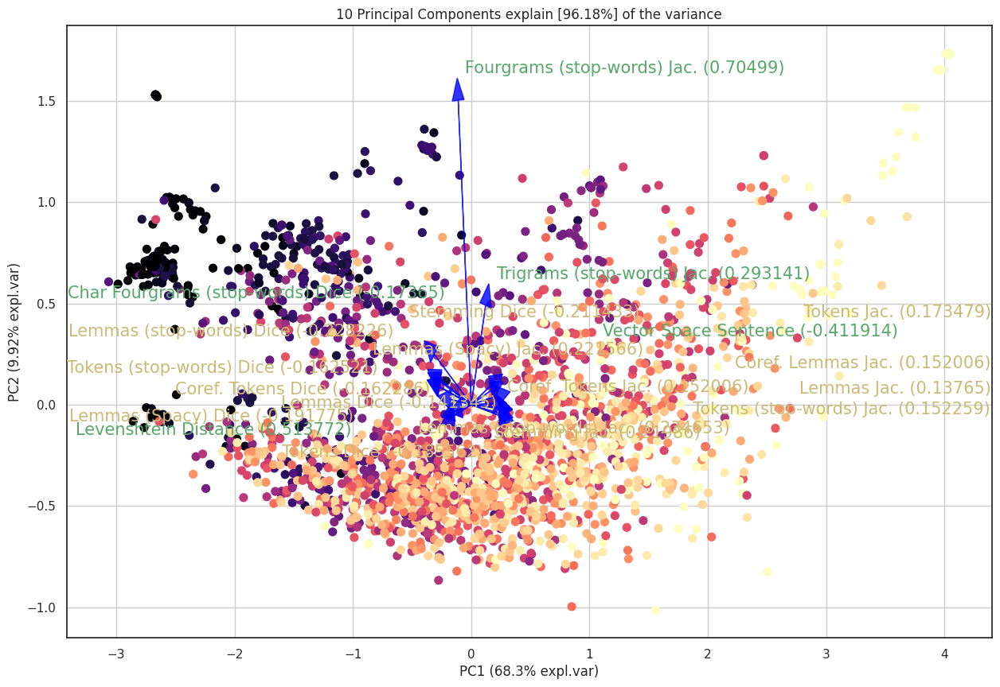

In [109]:
utils.PCA(train_lexic, y_train)

Darker color means the Gold Standard = 0, while whither means GS = 5. The colorbar just does not want to appear when using the notebook.

We can see that the first principal component already explains almost 70% of the data variability, and with 10 we explain more than 95%. Which means that there is a lot of redundant information on the 50-so lexical features we have.

Observing the biplot, we can see that 3-grams and 4-grams with Jaccard greatly explain the second principal component. Which was to be expected after witnessing the previous covariance matrix, as they are greatly separated from the rest. This does not mean that we will achieve good predictions with these features.

We can see how most values are not of low score, and, moreover, those that are seemed to be concentrated in the top left of the plot. Using the arrows of the biplot, we can see that those that have little value in the GS are those who have large value in 4-Grams and 3-Grams Jaccard, and large value of Stemming Dice. This interpretation is not perfect since we are only using a few of the components, but it helps us understand a bit the feature space.

#### Feature Combination

In [110]:
models_lex = Models(train_lexic, test_lexic, y_train, y_test, x_train['Origin'], x_test['Origin'], x_train)

# Build Model
models_lex.build_global('RandomForestRegressor')
models_lex.build_specific('RandomForestRegressor')
models_lex.build_ensemble('SVR')
# Evaluate Model
models_lex.evaluate_train()
models_lex.evaluate_test(validation = True)

--------------------------------------------------------------------------------
Evaluation on TRAINING

Pearson Correlation for each specific dataset:
             Pearson CV Train
Dataset                      
MSRpar               0.622680
MSRvid               0.832819
SMTeuroparl          0.679324

Average Pearson Correlation over all TRAIN CV:
         Average Pearson CV Train
Dataset                          
Overall                  0.711162
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Evaluation on VALIDATION

Pearson Correlation for each specific dataset:
             Pearson Validation
Dataset                        
MSRpar                 0.658262
MSRvid                 0.789863
SMTeuroparl            0.701845

Overall Pearson Correlation for the concatenation of the VALIDATION datasets:
         Pearson Validation
Dataset                    
Overall           

Using this subset of the whole feature set, we see that we get very comparable results to the building of the model with the full dataset of features.

#### Feature Importance

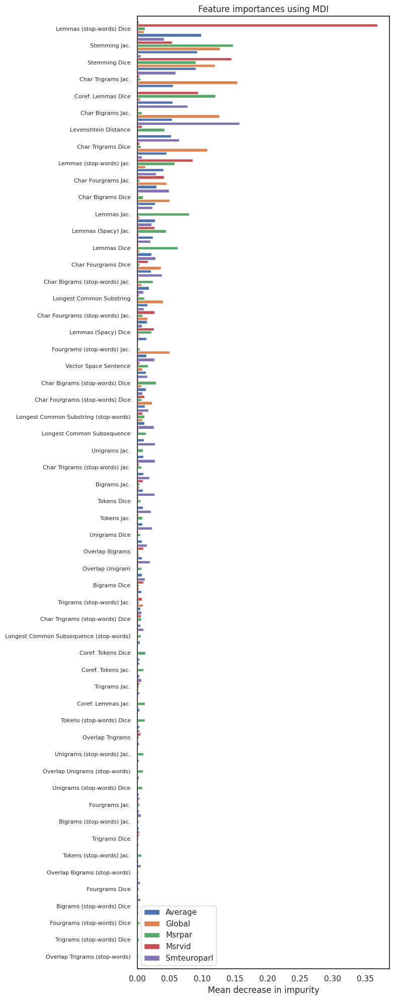

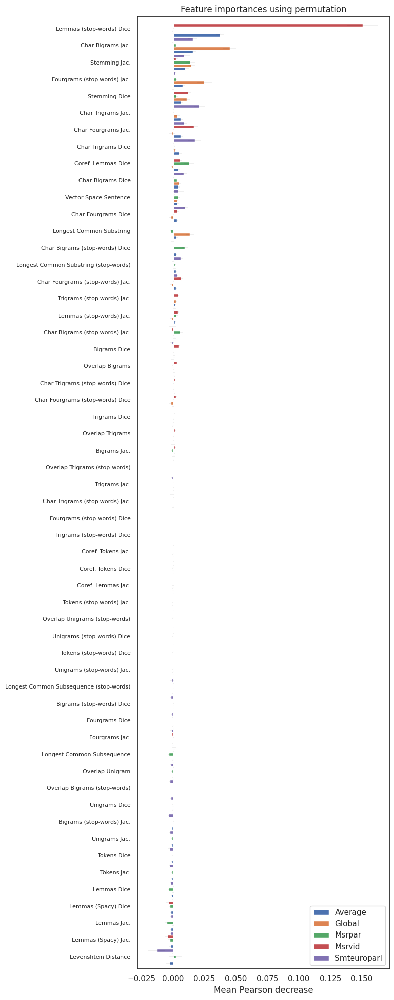

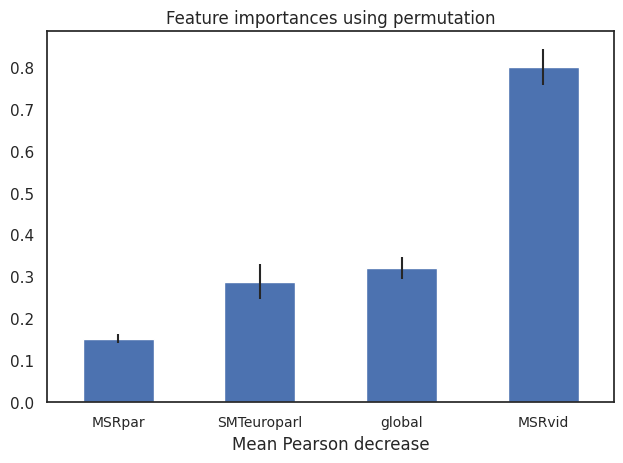

In [111]:
# Feature Importance
models_lex.feature_importance()


- For the *Specific* and *Global* regressors, we order the overall mean importance on each of the datasets. Here is a summary of the most important observations:
  - For MSRvid, the Lemma filtered with stop-words and using Dice seems to be very relevant to predict the similarity. However, for the other datasets, this features seems irrelevant. 
  - Stemming seems important for all text origins, however, on the permutation plot it odes not seem that important.
  - Overall, character N-grams seem more important to predict the similarity than the word N-grams. These have quite a bit of relevance.
  - Observing the permutation plot, we can see that after 20 features, most of them have very little impact on the Pearson correlation decrease. Thus, we could probably do with much fewer features than what we have now.


- Regarding the Ensemble, we see how it is putting more importance on the predictions of the MSRvid than the others. Recall from previous outputs, where the output of MSRvid was always the one that achieved highest results. This is perhaps because it is fitting better this dataset than the other ones, and thus, it can extract more information from this set. The rest of the regressors predictions are pretty similar in importance.

Thus, let us now reduce the Feature set.

#### Feature Selection

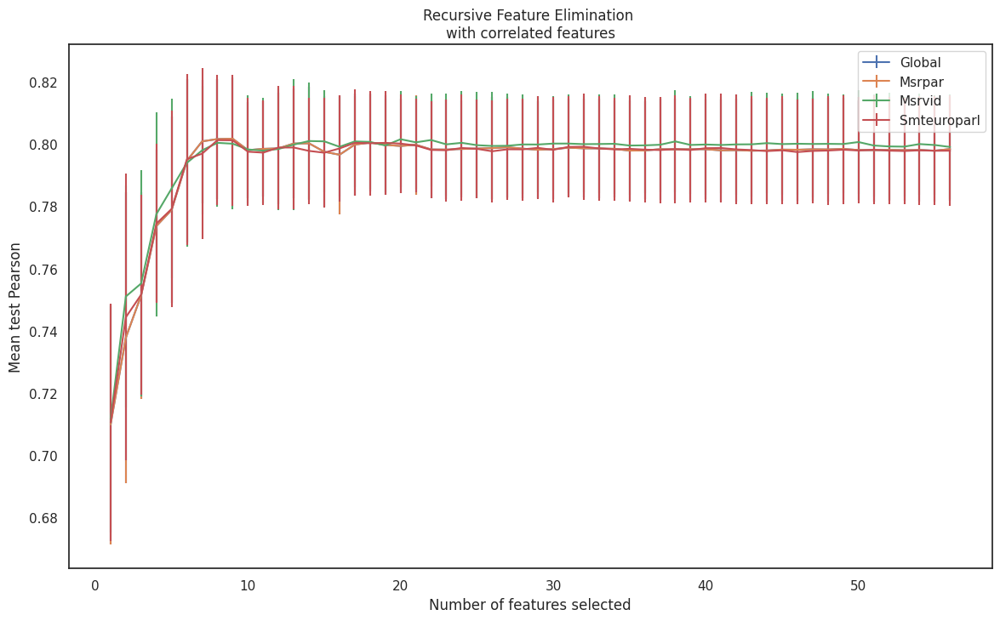

Original number of features: 56
Reduced number of features: 20

We keep for each model the following:
Global using now: 9 features
Msrpar using now: 9 features
Msrvid using now: 20 features
Smteuroparl using now: 8 features


In [112]:
# Feature Selection
models_lex.feature_selection()

We have reduced to 20 unique features, the process of reduction is already explained in the methodology, but it uses the Feature Importance to recursively remove features while using cross validation to measure the impact. 

--------------------------------------------------------------------------------
Evaluation on TRAINING

Pearson Correlation for each specific dataset:
             Pearson CV Train
Dataset                      
MSRpar               0.615800
MSRvid               0.834429
SMTeuroparl          0.663380

Average Pearson Correlation over all TRAIN CV:
         Average Pearson CV Train
Dataset                          
Overall                  0.704107
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Evaluation on VALIDATION

Pearson Correlation for each specific dataset:
             Pearson Validation
Dataset                        
MSRpar                 0.649225
MSRvid                 0.792062
SMTeuroparl            0.668660

Overall Pearson Correlation for the concatenation of the VALIDATION datasets:
         Pearson Validation
Dataset                    
Overall           

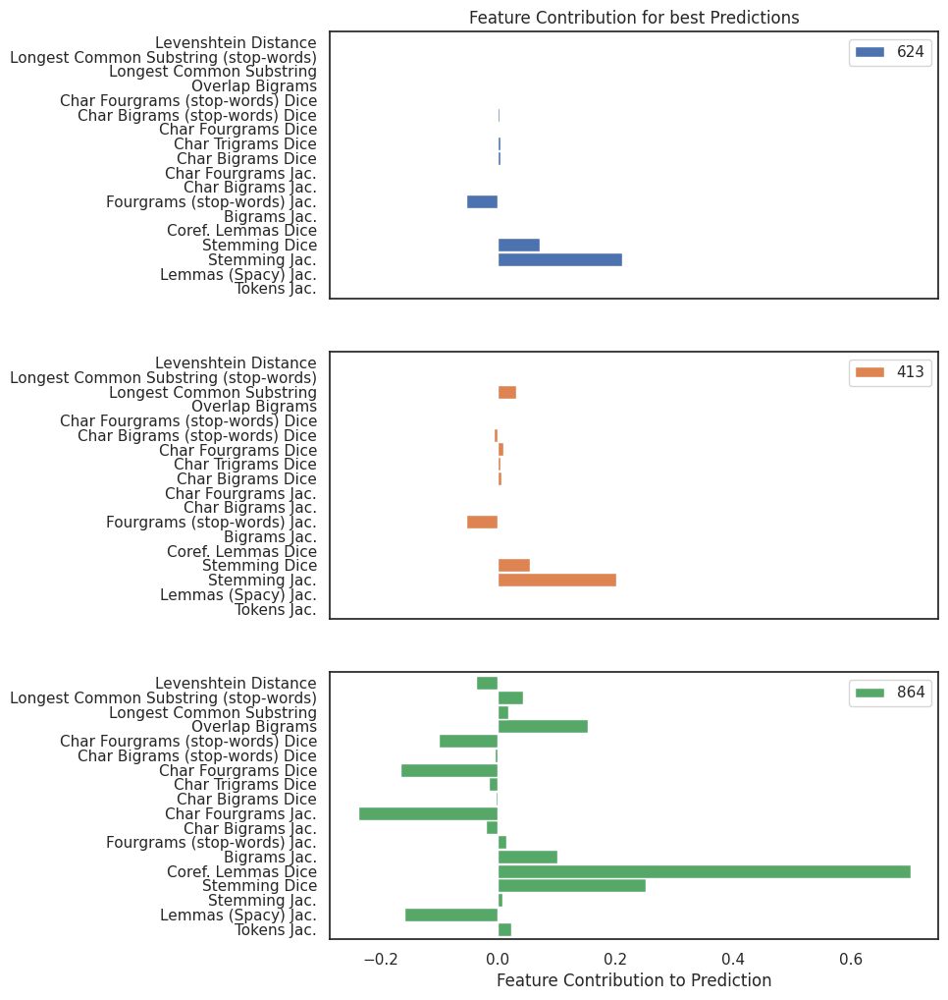

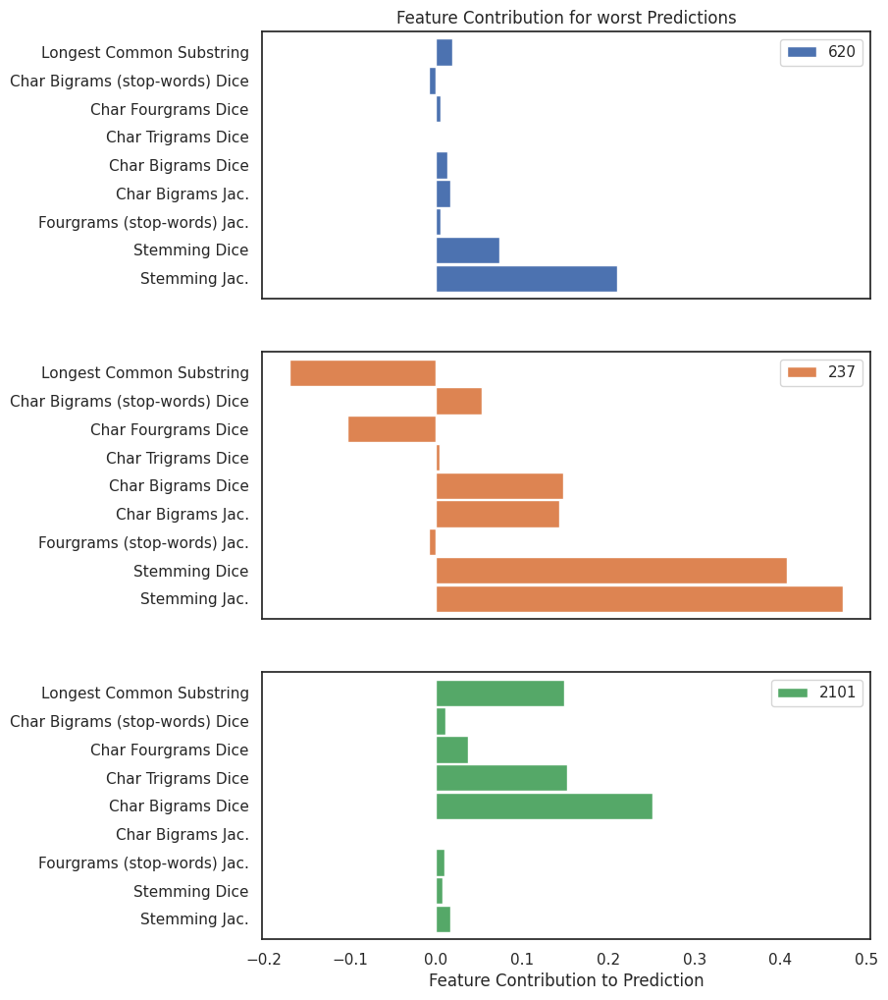

In [113]:
# Rebuild the models
models_lex.build_specific('RandomForestRegressor')
models_lex.build_global('RandomForestRegressor')
models_lex.build_ensemble('SVR')
models_lex.evaluate_train()
models_lex.evaluate_test(validation = True, is_ensemble = True, print_failures = True, plot_interpretations = True)

In [ ]:
# Build Model with all Data and evaluate it on Test
models_lex.is_final()
models_lex.build_global('RandomForestRegressor')
models_lex.build_specific('RandomForestRegressor')
models_lex.build_ensemble('SVR')
models_lex.evaluate_train()
models_lex.evaluate_test(validation = False, is_ensemble = True)

--------------------------------------------------------------------------------
Evaluation on TRAINING

Pearson Correlation for each specific dataset:
             Pearson CV Train
Dataset                      
MSRpar               0.628259
MSRvid               0.771817
SMTeuroparl          0.702119

Average Pearson Correlation over all TRAIN CV:
         Average Pearson CV Train
Dataset                          
Overall                  0.700338
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Evaluation on TEST

Pearson Correlation for each specific dataset:
                  Pearson Test
Dataset                       
MSRpar                0.598340
MSRvid                0.839851
SMTeuroparl           0.554867
surprise.OnWN         0.717359
surprise.SMTnews      0.511745

Overall Pearson Correlation for the concatenation of the TEST datasets:
         Pearson Test
Dataset

### Syntactical Features

In [ ]:
utils.covariance_matrix_plot(train_syntactic, y_train)

[pca] >Processing dataframe..
[pca] >The PCA reduction is performed on the [12] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[10]
[pca] >Outlier detection using SPE/DmodX with n_std=[2]
[pca] >Plot PC1 vs PC2 with loadings.


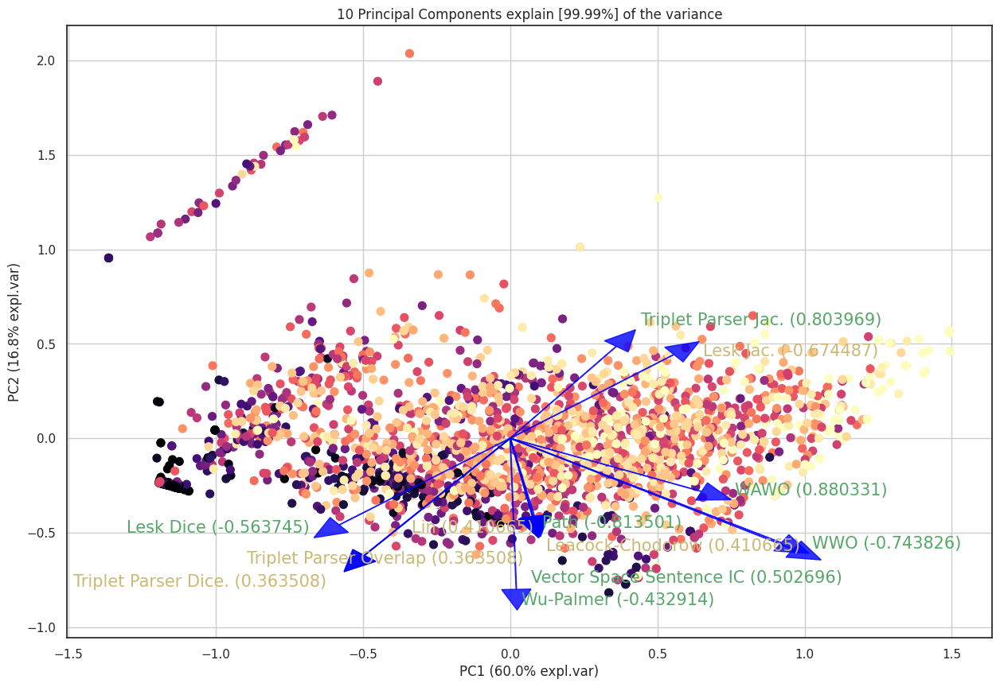

In [ ]:
utils.PCA(train_syntactic, y_train)

In [ ]:
models_syn = Models(train_syntactic, test_syntactic, y_train, y_test, x_train['Origin'], x_test['Origin'], x_train)

# Build Model
models_syn.build_global('RandomForestRegressor')
models_syn.build_specific('RandomForestRegressor')
models_syn.build_ensemble('SVR')
# Evaluate Model
models_syn.evaluate_train()
models_syn.evaluate_test(validation = True)

--------------------------------------------------------------------------------
Evaluation on TRAINING

Pearson Correlation for each specific dataset:
             Pearson CV Train
Dataset                      
MSRpar               0.486675
MSRvid               0.777105
SMTeuroparl          0.588561

Average Pearson Correlation over all TRAIN CV:
         Average Pearson CV Train
Dataset                          
Overall                   0.61676
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Evaluation on VALIDATION

Pearson Correlation for each specific dataset:
             Pearson Validation
Dataset                        
MSRpar                 0.566023
MSRvid                 0.759235
SMTeuroparl            0.695317

Overall Pearson Correlation for the concatenation of the VALIDATION datasets:
         Pearson Validation
Dataset                    
Overall           

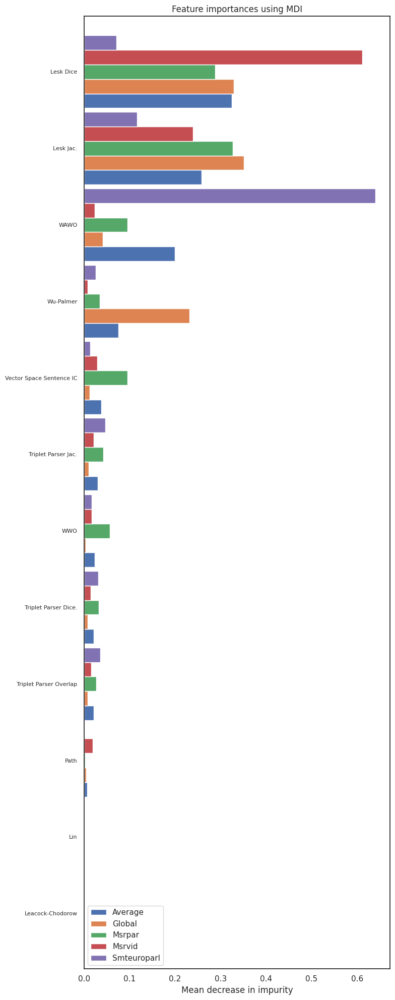

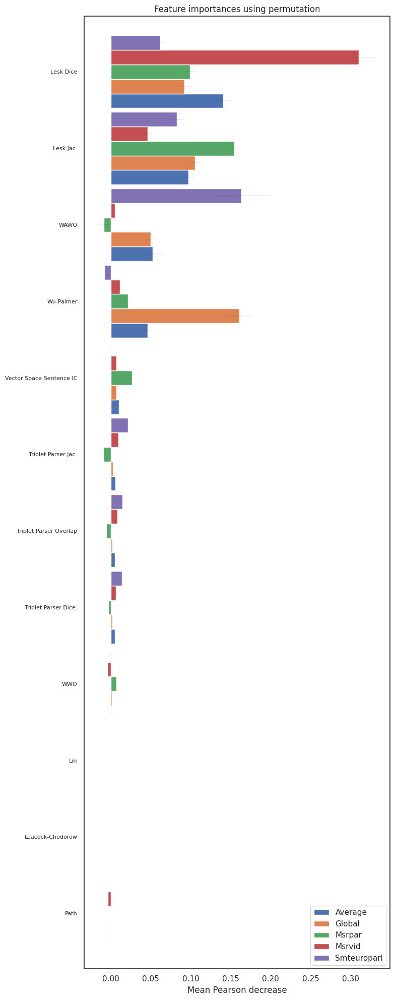

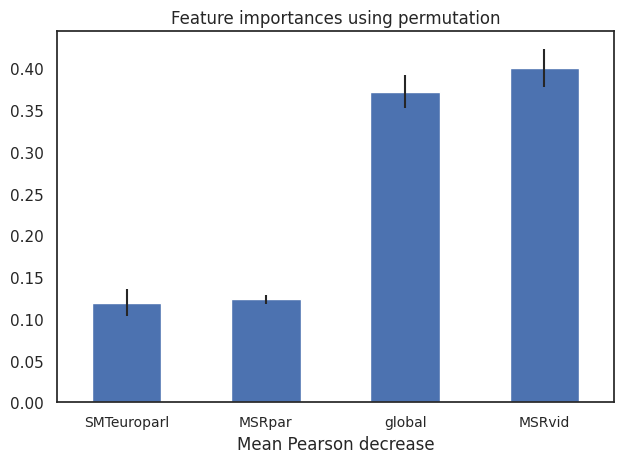

In [ ]:
# Feature Importance
models_syn.feature_importance()

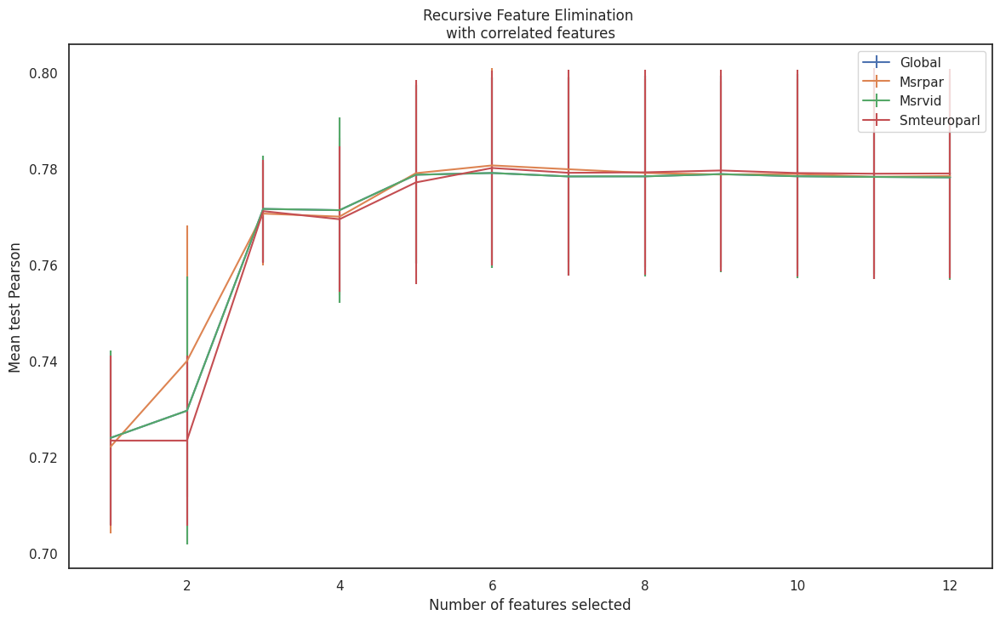

Original number of features: 12
Reduced number of features: 8

We keep for each model the following:
Global using now: 6 features
Msrpar using now: 6 features
Msrvid using now: 6 features
Smteuroparl using now: 6 features


In [ ]:
# Feature Selection
models_syn.feature_selection()

--------------------------------------------------------------------------------
Evaluation on TRAINING

Pearson Correlation for each specific dataset:
             Pearson CV Train
Dataset                      
MSRpar               0.488727
MSRvid               0.776688
SMTeuroparl          0.587792

Average Pearson Correlation over all TRAIN CV:
         Average Pearson CV Train
Dataset                          
Overall                   0.61706
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Evaluation on VALIDATION

Pearson Correlation for each specific dataset:
             Pearson Validation
Dataset                        
MSRpar                 0.569073
MSRvid                 0.762480
SMTeuroparl            0.697929

Overall Pearson Correlation for the concatenation of the VALIDATION datasets:
         Pearson Validation
Dataset                    
Overall           

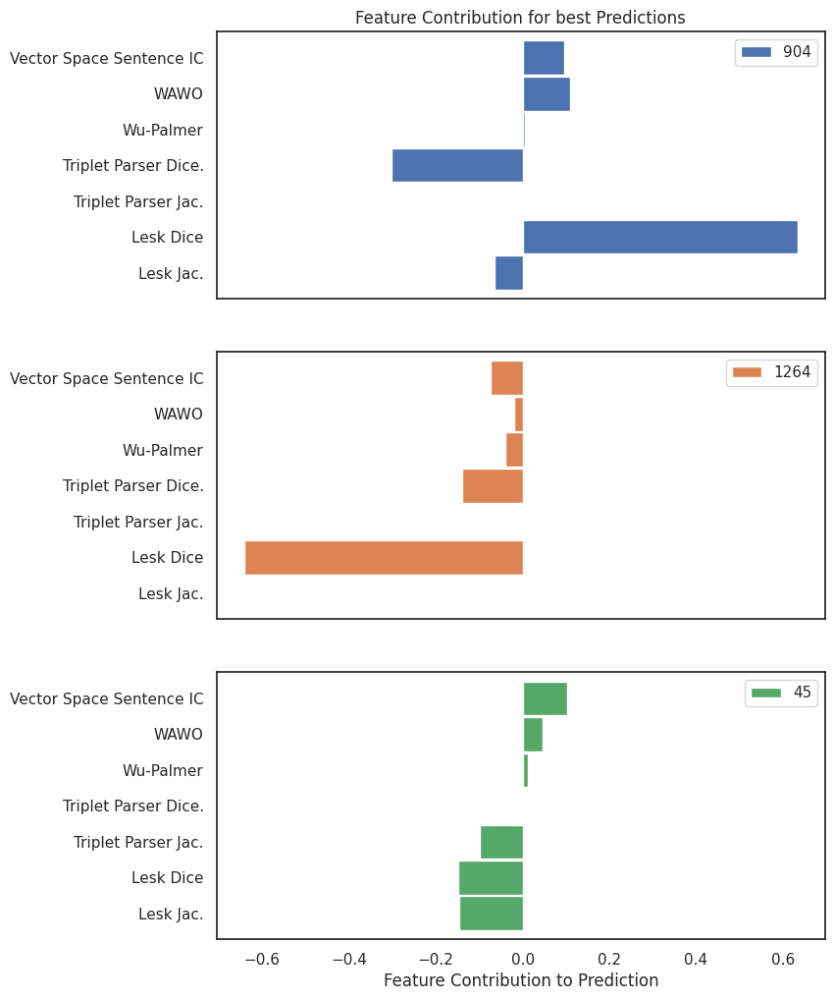

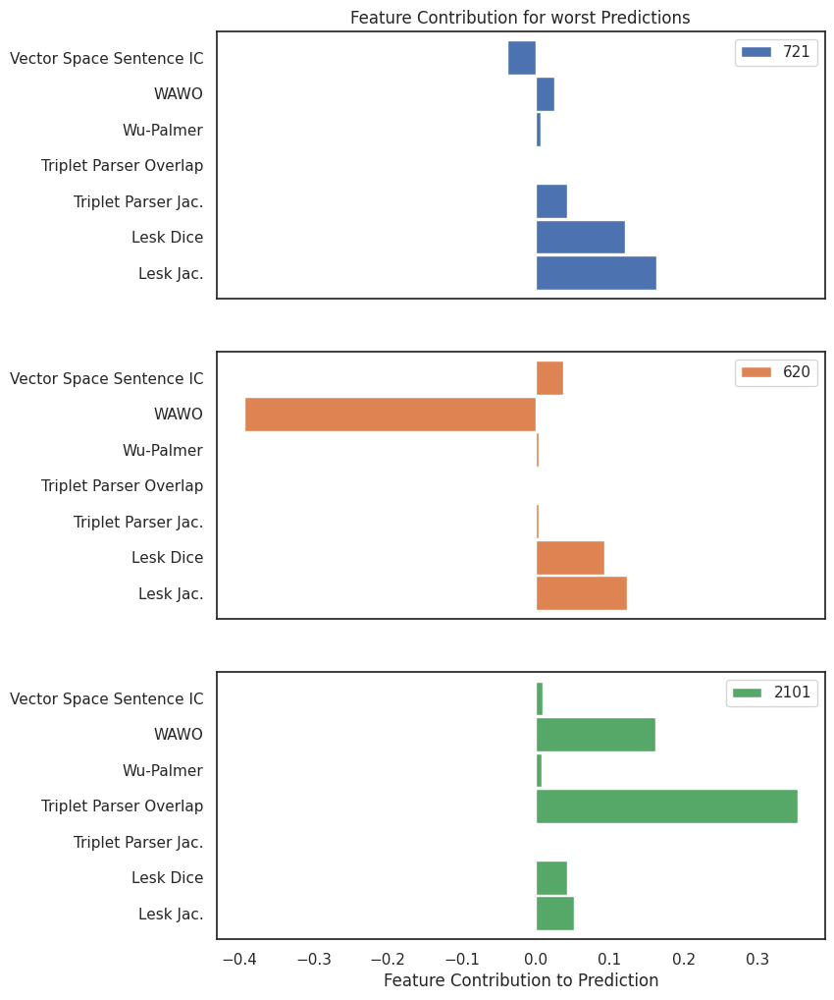

In [ ]:
# Rebuild the models
models_syn.build_specific('RandomForestRegressor')
models_syn.build_global('RandomForestRegressor')
models_syn.build_ensemble('SVR')
models_syn.evaluate_train()
models_syn.evaluate_test(validation = True, is_ensemble = True, print_failures = True, plot_interpretations = True)

In [ ]:
# Build Model with all Data and evaluate it on Test
models_syn.is_final()
models_syn.build_global('RandomForestRegressor')
models_syn.build_specific('RandomForestRegressor')
models_syn.build_ensemble('SVR')
models_syn.evaluate_train()
models_syn.evaluate_test(validation = False, is_ensemble = True)

--------------------------------------------------------------------------------
Evaluation on TRAINING

Pearson Correlation for each specific dataset:
             Pearson CV Train
Dataset                      
MSRpar               0.523855
MSRvid               0.688652
SMTeuroparl          0.696939

Average Pearson Correlation over all TRAIN CV:
         Average Pearson CV Train
Dataset                          
Overall                  0.635765
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Evaluation on TEST

Pearson Correlation for each specific dataset:
                  Pearson Test
Dataset                       
MSRpar                0.485519
MSRvid                0.803870
SMTeuroparl           0.120133
surprise.OnWN         0.595968
surprise.SMTnews      0.385606

Overall Pearson Correlation for the concatenation of the TEST datasets:
         Pearson Test
Dataset

## All features

In [ ]:
utils.covariance_matrix_plot(train_all, y_train)

[pca] >Processing dataframe..
[pca] >The PCA reduction is performed on the [80] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[10]
[pca] >Outlier detection using SPE/DmodX with n_std=[2]
[pca] >Plot PC1 vs PC2 with loadings.


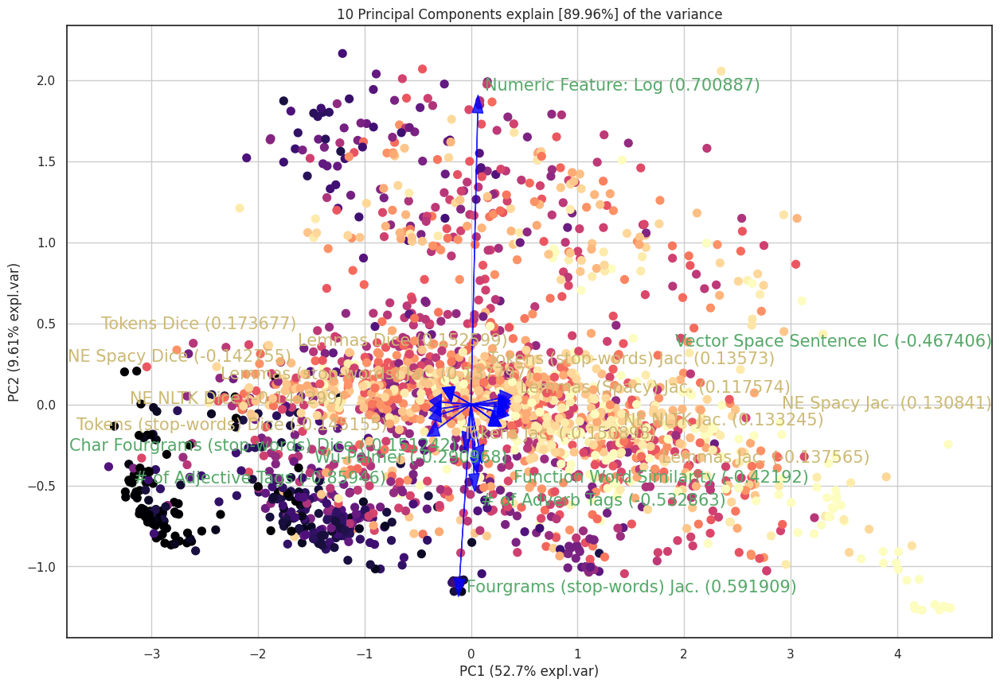

In [ ]:
utils.PCA(train_all, y_train)

In [ ]:
models_all = Models(train_all, test_all, y_train, y_test, x_train['Origin'], x_test['Origin'], x_train)
# Build Model
models_all.build_global('RandomForestRegressor')
models_all.build_specific('RandomForestRegressor')
models_all.build_ensemble('SVR')

# Evaluate Model
models_all.evaluate_train()
models_all.evaluate_test(validation = True)

--------------------------------------------------------------------------------
Evaluation on TRAINING

Pearson Correlation for each specific dataset:
             Pearson CV Train
Dataset                      
MSRpar               0.691545
MSRvid               0.834921
SMTeuroparl          0.684320

Average Pearson Correlation over all TRAIN CV:
         Average Pearson CV Train
Dataset                          
Overall                  0.736762
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Evaluation on VALIDATION

Pearson Correlation for each specific dataset:
             Pearson Validation
Dataset                        
MSRpar                 0.716854
MSRvid                 0.790410
SMTeuroparl            0.721437

Overall Pearson Correlation for the concatenation of the VALIDATION datasets:
         Pearson Validation
Dataset                    
Overall           

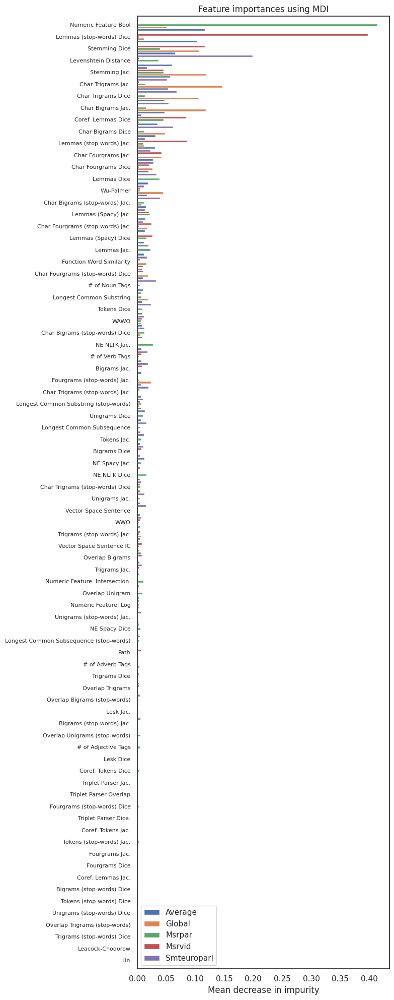

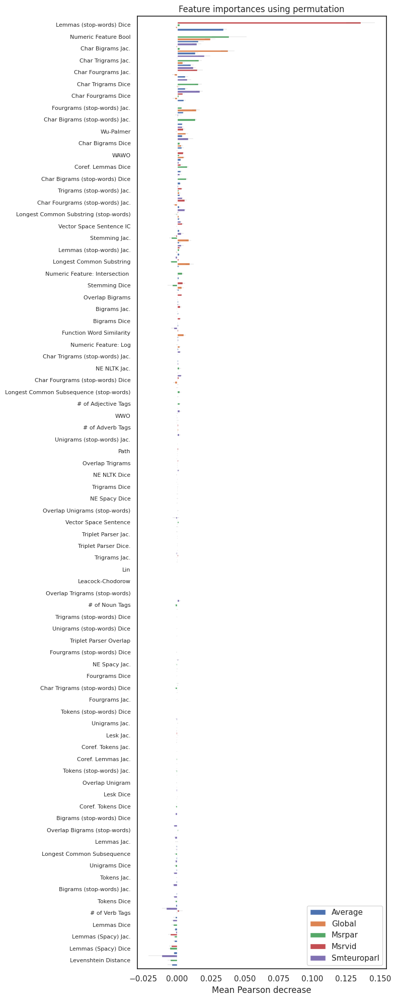

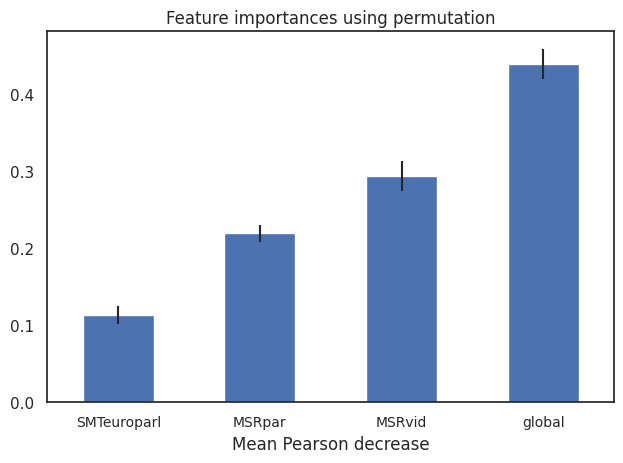

In [ ]:
# Feature Importance
models_all.feature_importance()

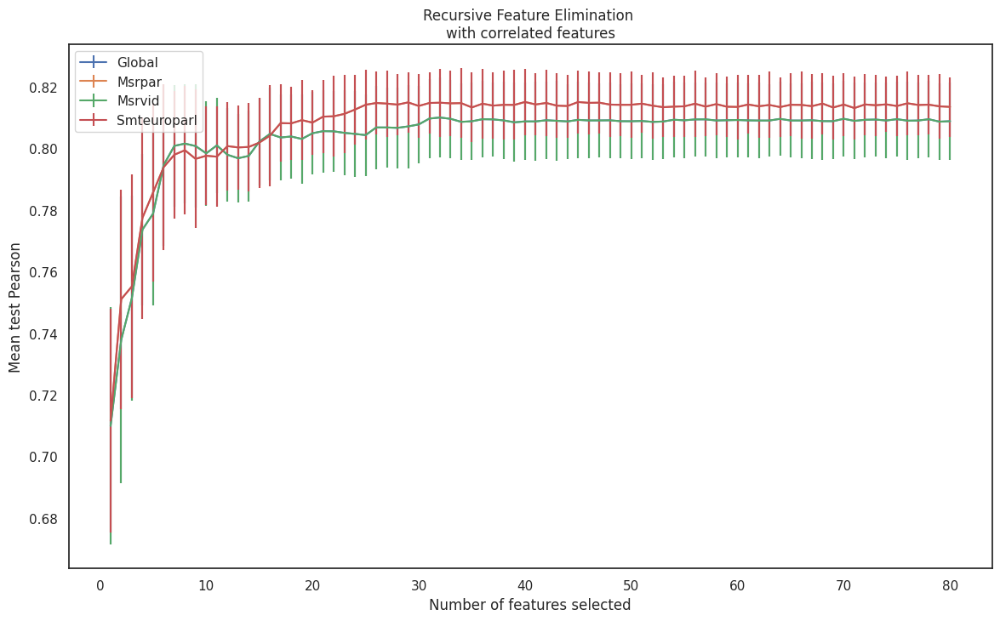

Original number of features: 80
Reduced number of features: 41

We keep for each model the following:
Global using now: 32 features
Msrpar using now: 40 features
Msrvid using now: 32 features
Smteuroparl using now: 40 features


In [ ]:
# Feature Selection
models_all.feature_selection()

--------------------------------------------------------------------------------
Evaluation on TRAINING

Pearson Correlation for each specific dataset:
             Pearson CV Train
Dataset                      
MSRpar               0.690965
MSRvid               0.833948
SMTeuroparl          0.678669

Average Pearson Correlation over all TRAIN CV:
         Average Pearson CV Train
Dataset                          
Overall                  0.734376
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Evaluation on VALIDATION

Pearson Correlation for each specific dataset:
             Pearson Validation
Dataset                        
MSRpar                 0.720774
MSRvid                 0.782965
SMTeuroparl            0.705502

Overall Pearson Correlation for the concatenation of the VALIDATION datasets:
         Pearson Validation
Dataset                    
Overall           

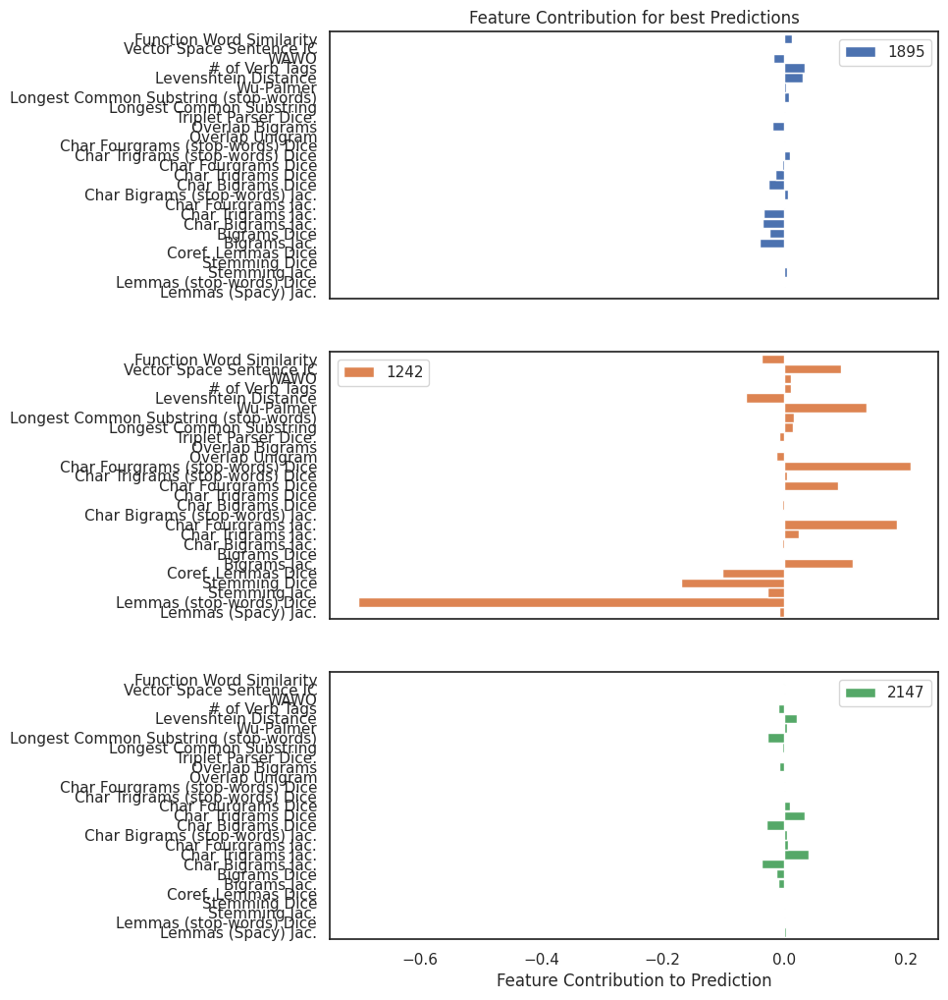

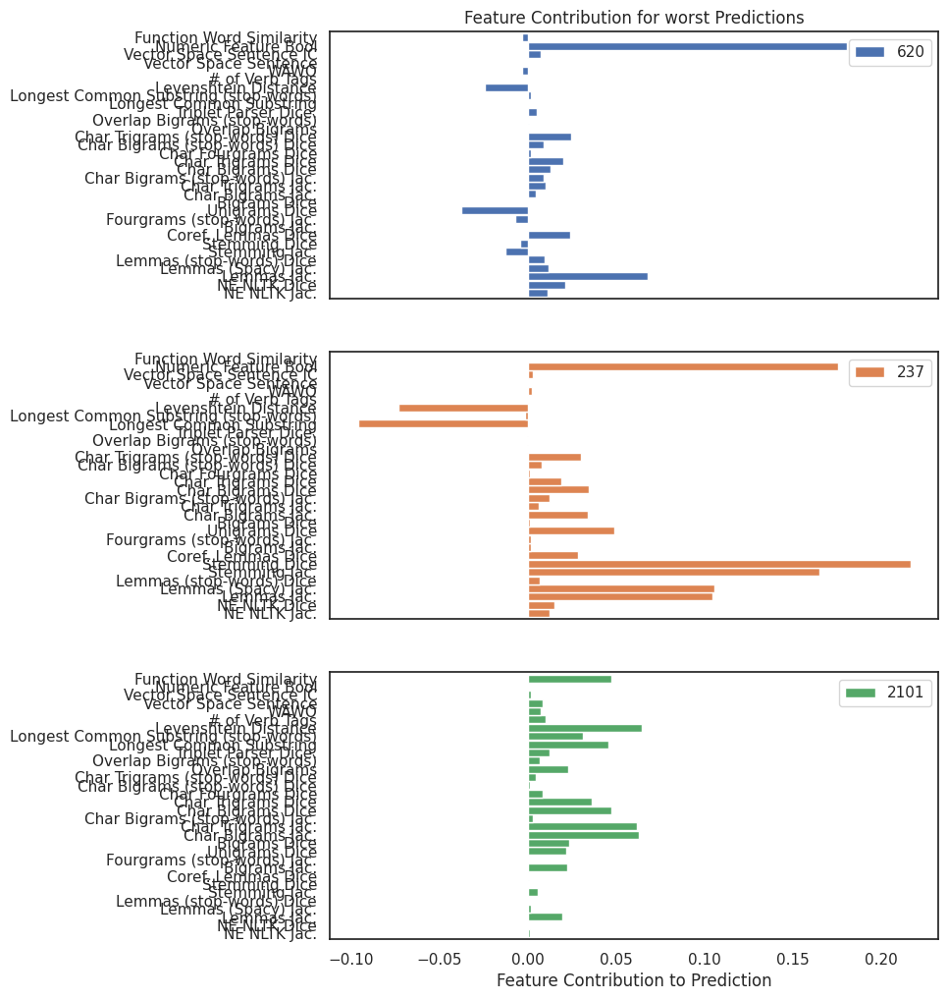

In [ ]:
# Rebuild the models
models_all.build_specific('RandomForestRegressor')
models_all.build_global('RandomForestRegressor')
models_all.build_ensemble('SVR')
models_all.evaluate_train()
models_all.evaluate_test(validation = True, is_ensemble = True, print_failures = True, plot_interpretations = True)

In [ ]:
# Build Model with all Data and evaluate it on Test
models_all.is_final()
models_all.build_global('RandomForestRegressor')
models_all.build_specific('RandomForestRegressor')
models_all.build_ensemble('SVR')
models_all.evaluate_train()
models_all.evaluate_test(validation = False, is_ensemble = True)

--------------------------------------------------------------------------------
Evaluation on TRAINING

Pearson Correlation for each specific dataset:
             Pearson CV Train
Dataset                      
MSRpar               0.698192
MSRvid               0.763084
SMTeuroparl          0.728733

Average Pearson Correlation over all TRAIN CV:
         Average Pearson CV Train
Dataset                          
Overall                  0.729834
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Evaluation on TEST

Pearson Correlation for each specific dataset:
                  Pearson Test
Dataset                       
MSRpar                0.687143
MSRvid                0.847435
SMTeuroparl           0.576274
surprise.OnWN         0.718463
surprise.SMTnews      0.513908

Overall Pearson Correlation for the concatenation of the TEST datasets:
         Pearson Test
Dataset